# 📦 Packages

In [50]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 🗃️ Load Dataframes

In [ ]:
df = pd.read_csv('SP26_5k_Interactions_Assignment_Dataset_Final.csv')
display(df.head())

,NPC ID,NPC friendliness,NPC item value,NPC quest value,NPC gender,NPC class,NPC area level,User ID,User level,User class,Interaction length,Interaction text exchanges,Interaction quests acquired,Interaction transactions
0,343,31.44,1,-4,M,Mage,10,33624,12,Fighter,8.95,16,3,2
1,350,84.43,5,5,F,Mage,40,23345,43,Thief,11.69,15,3,5
2,337,44.56,-1,1,F,Thief,40,76756,43,Fighter,11.46,14,3,5
3,350,63.13,5,5,F,Mage,40,69028,38,Fighter,11.32,15,3,5
4,329,70.30,0,-1,F,Mage,10,88605,11,Thief,5.75,16,2,3


,NPC ID,NPC friendliness,NPC item value,NPC quest value,NPC gender,NPC class,NPC area level
0,301,15.864553,-2,5,F,Fighter,40
1,302,60.625093,2,-5,F,Mage,10
2,303,0.961000,0,1,M,Thief,10
3,304,76.020619,3,-5,M,Thief,10
4,305,31.720798,0,-2,F,Thief,30


,NPC ID,NPC friendliness,NPC item value,NPC quest value,NPC gender,NPC class,NPC area level
0,1,44.046801,0,0,M,Mage,20
1,2,7.307940,0,0,F,Mage,30
2,3,71.651113,0,0,M,Mage,40
3,4,91.329419,-3,-1,M,Thief,20
4,5,45.316890,1,0,M,Mage,40


In [22]:
npc_attributes = [col for col in df.columns if col.startswith('NPC') and col != 'NPC ID']
print('NPC attributes:', npc_attributes)

user_attributes = [col for col in df.columns if col.startswith('User') and col != 'User ID']
print('User attributes:', user_attributes)

features = npc_attributes + user_attributes # features includes npc and user attributes

interaction_attributes = [col for col in df.columns if col.startswith('Interaction')]
print('Interaction attributes:', interaction_attributes)

NPC attributes: ['NPC friendliness', 'NPC item value', 'NPC quest value', 'NPC gender', 'NPC class', 'NPC area level']
User attributes: ['User level', 'User class', 'User engagement']
Interaction attributes: ['Interaction length', 'Interaction text exchanges', 'Interaction quests acquired', 'Interaction transactions', 'Interaction length (scaled)', 'Interaction text exchanges (scaled)', 'Interaction quests acquired (scaled)', 'Interaction transactions (scaled)']


# 🧪 Engineer a Target Feature

I'll engineer a feature called `User engagement` that takes into account all the
interaction attributes listed above. Because the interaction attributes are
different scales, I'll have to normalize the values first. To do this, I'll use
min-max scaling so that each value lands somewhere between 0 and 1.


In [12]:
def scale_feature_min_max(df: pd.DataFrame, feature: str):
  '''Creates a new column in the df with the feature scaled'''
  f_min = df[feature].min()
  f_max = df[feature].max()
  df[f'{feature} (scaled)'] = (df[feature] - f_min) / (f_max - f_min)

target = 'User engagement'

for i in interaction_attributes:
  if i != target:
    scale_feature_min_max(df, i)

scaled_interaction_attributes = list(map(lambda i: f'{i} (scaled)', interaction_attributes))

df[target] = df[scaled_interaction_attributes].sum(axis=1)
display(df.describe())

if target not in interaction_attributes:
  interaction_attributes.append(target)

,NPC ID,NPC friendliness,NPC item value,NPC quest value,NPC area level,User ID,User level,Interaction length,Interaction text exchanges,Interaction quests acquired,Interaction transactions,Interaction length (scaled),Interaction text exchanges (scaled),Interaction quests acquired (scaled),Interaction transactions (scaled),User engagement
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,326.155800,55.824322,0.202000,-0.131200,27.654000,50667.294800,27.750400,10.114070,15.64780,3.149400,3.983800,0.790156,0.720650,0.537350,0.663967,2.712122
std,14.556906,34.248925,3.265537,3.212919,11.652615,23670.745972,12.184506,1.965065,1.30893,0.752325,1.392525,0.172829,0.109078,0.188081,0.232087,0.375498
min,301.000000,0.000000,-5.000000,-5.000000,10.000000,10182.000000,5.000000,1.130000,7.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.526385
25%,314.000000,23.395000,-2.000000,-3.000000,20.000000,29937.000000,15.000000,9.300000,15.00000,3.000000,3.000000,0.718558,0.666667,0.500000,0.500000,2.662379
50%,327.000000,57.915000,0.000000,0.000000,30.000000,51254.000000,31.000000,10.640000,16.00000,3.000000,5.000000,0.836412,0.750000,0.500000,0.833333,2.810796
75%,338.000000,86.922500,3.000000,2.000000,40.000000,71603.750000,38.000000,11.520000,16.00000,3.000000,5.000000,0.913808,0.750000,0.500000,0.833333,2.915787
max,350.000000,121.790000,5.000000,5.000000,40.000000,89979.000000,45.000000,12.500000,19.00000,5.000000,6.000000,1.000000,1.000000,1.000000,1.000000,3.353342


# 🗺️ Explore Dataset

In [5]:
print('Columns to describe:', features+interaction_attributes)
df[features + interaction_attributes].describe()

Columns to describe: ['NPC friendliness', 'NPC item value', 'NPC quest value', 'NPC gender', 'NPC class', 'NPC area level', 'User level', 'User class', 'Interaction length', 'Interaction text exchanges', 'Interaction quests acquired', 'Interaction transactions', 'User engagement']


,NPC friendliness,NPC item value,NPC quest value,NPC area level,User level,Interaction length,Interaction text exchanges,Interaction quests acquired,Interaction transactions,User engagement
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000
mean,55.824322,0.202000,-0.131200,27.654000,27.750400,10.114070,15.64780,3.149400,3.983800,2.712122
std,34.248925,3.265537,3.212919,11.652615,12.184506,1.965065,1.30893,0.752325,1.392525,0.375498
min,0.000000,-5.000000,-5.000000,10.000000,5.000000,1.130000,7.00000,1.000000,0.000000,0.526385
25%,23.395000,-2.000000,-3.000000,20.000000,15.000000,9.300000,15.00000,3.000000,3.000000,2.662379
50%,57.915000,0.000000,0.000000,30.000000,31.000000,10.640000,16.00000,3.000000,5.000000,2.810796
75%,86.922500,3.000000,2.000000,40.000000,38.000000,11.520000,16.00000,3.000000,5.000000,2.915787
max,121.790000,5.000000,5.000000,40.000000,45.000000,12.500000,19.00000,5.000000,6.000000,3.353342


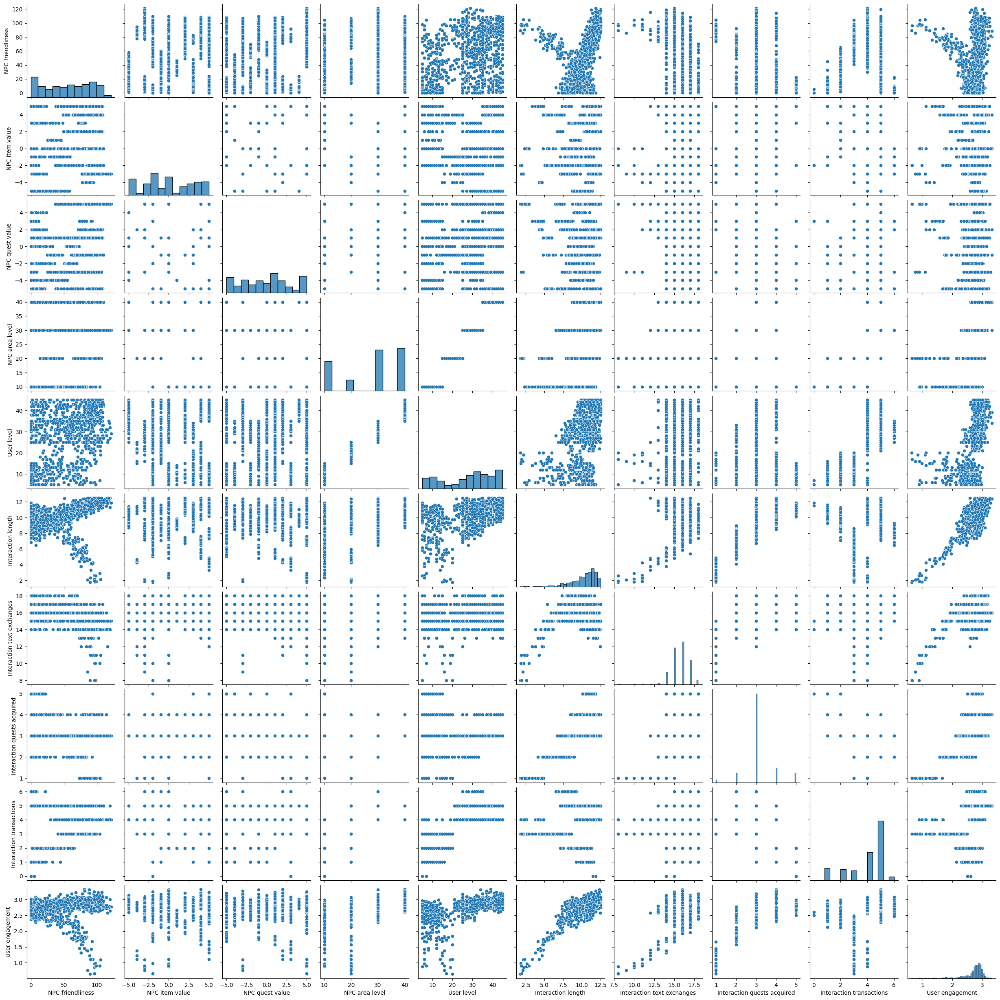

In [29]:
sns.pairplot(df[features + interaction_attributes].sample(1000))

It looks like there are two populations in `NPC friendliness x Interaction length`.
There are also two clusters in `User level x Interaction length`. Let's see if
we can find what separates them.

Text(0.5, 1.0, 'Friendliness x User Engagement')

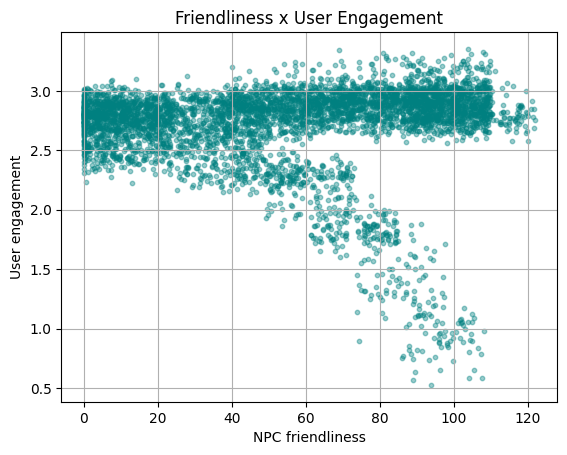

In [144]:
plt.grid()
plt.scatter(df['NPC friendliness'], df['User engagement'], s=10, alpha=0.4, c='teal')
plt.xlabel('NPC friendliness')
plt.ylabel('User engagement')
plt.title('Friendliness x User Engagement')


Text(0.5, 1.0, 'User level x User Engagement')

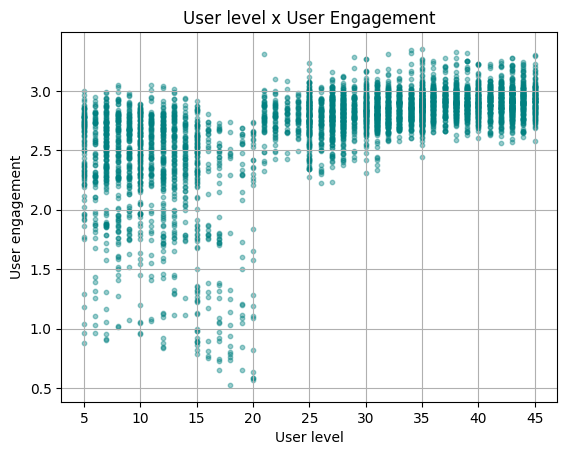

In [145]:
plt.grid()
plt.scatter(df['User level'], df['User engagement'], s=10, alpha=0.4, c='teal')
plt.xlabel('User level')
plt.ylabel('User engagement')
plt.title('User level x User Engagement')


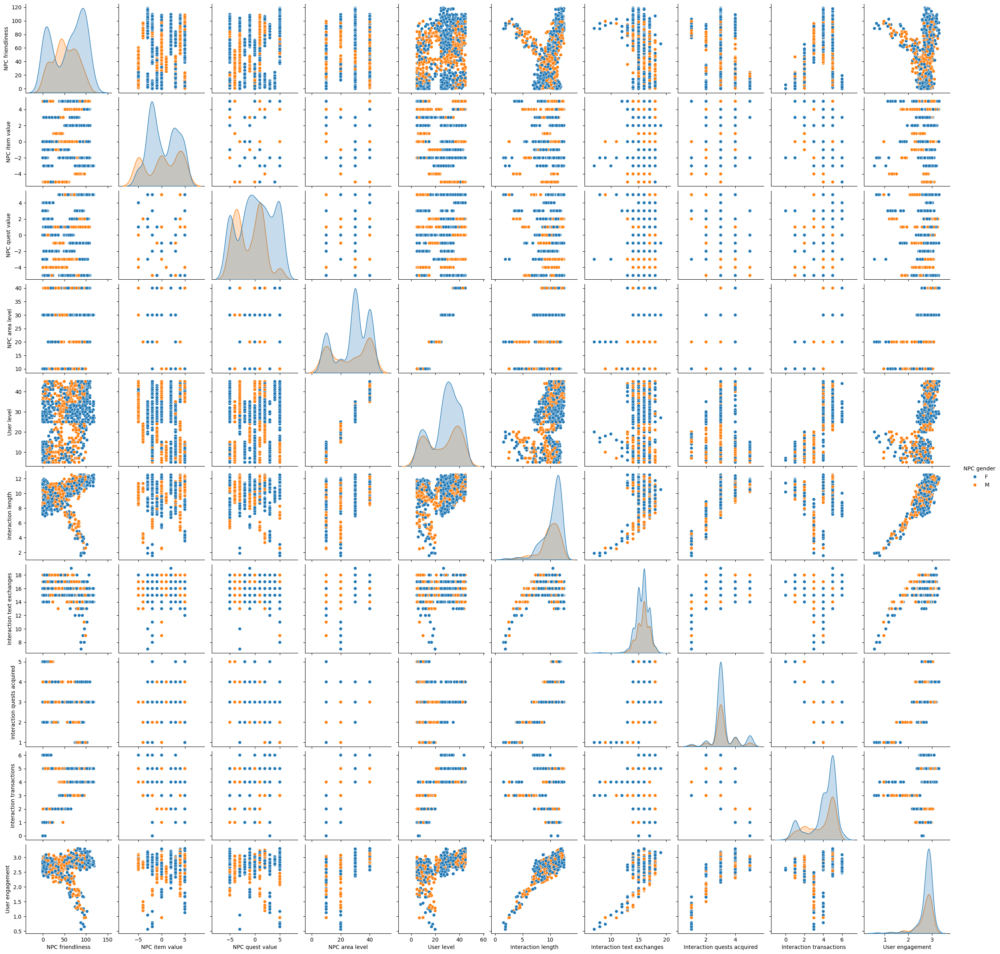

In [30]:
sns.pairplot(df[features + interaction_attributes].sample(1000), hue='NPC gender')

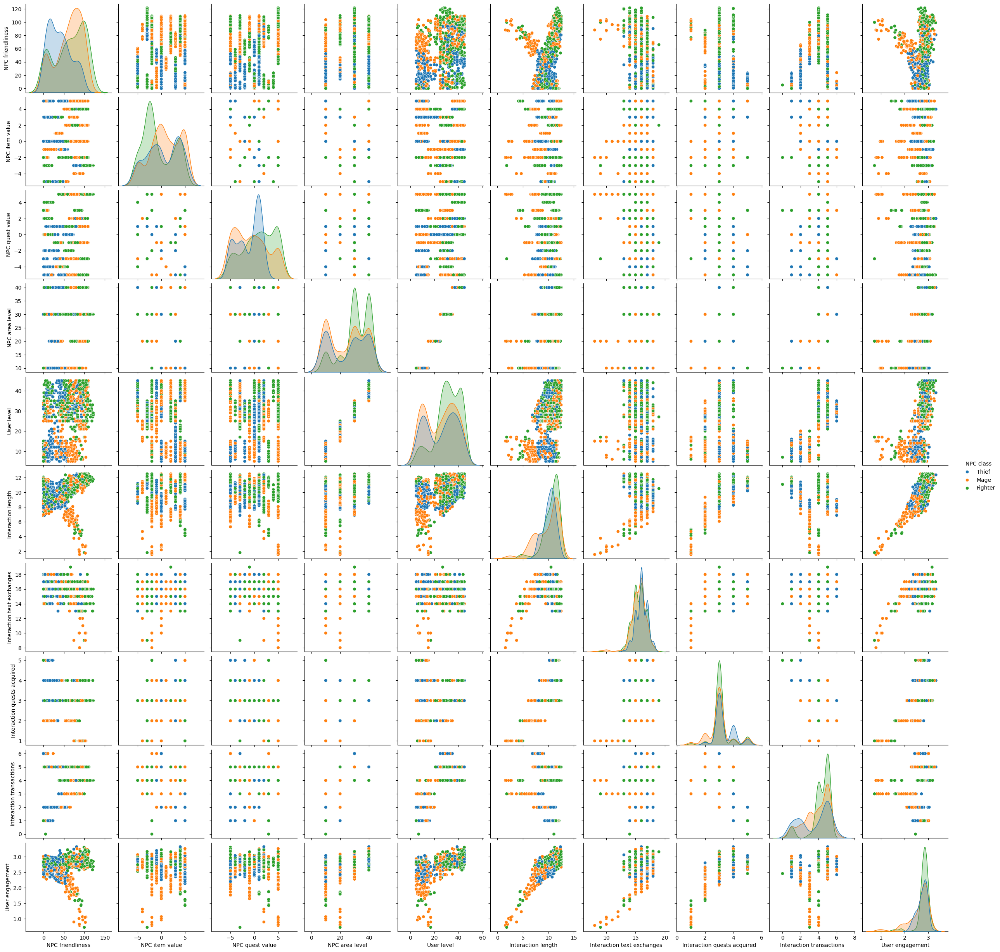

In [31]:
sns.pairplot(df[features + interaction_attributes].sample(1000), hue='NPC class')

It looks like Thief and Fighter NPCs tend to have higher user engagement than
Mages.

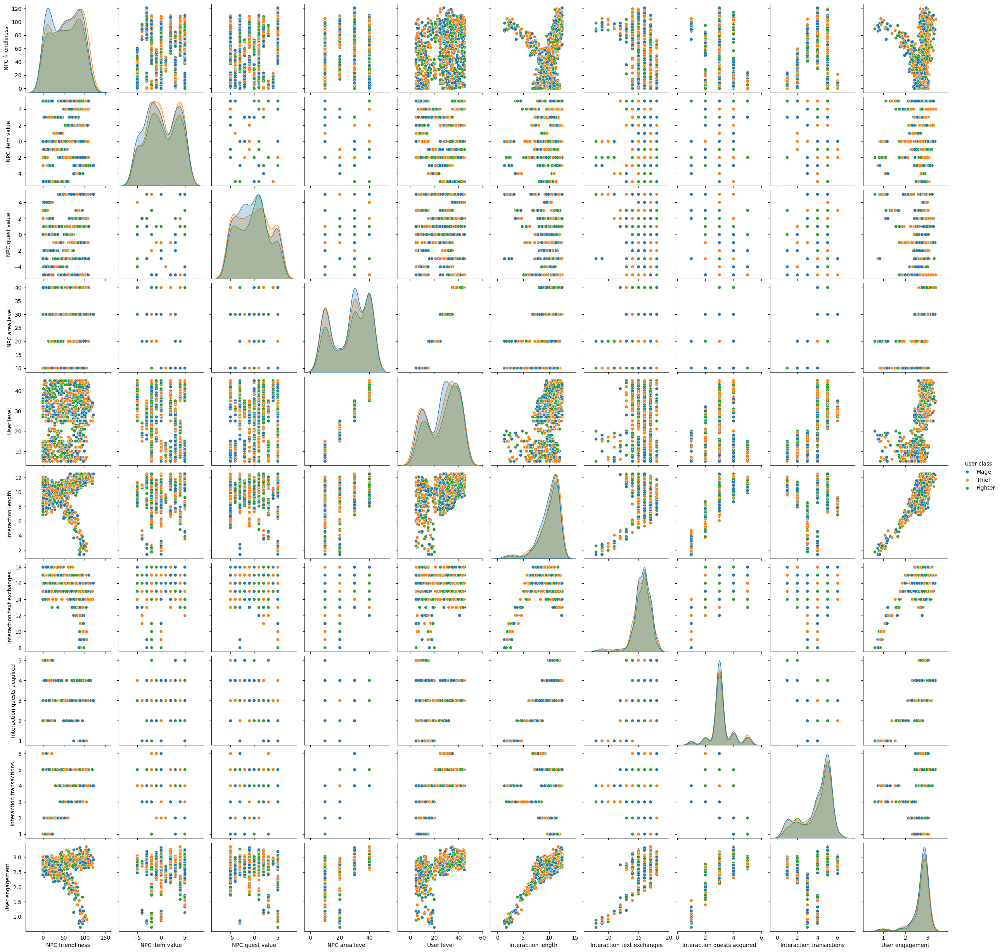

In [32]:
sns.pairplot(df[features + interaction_attributes].sample(1000), hue='User class')

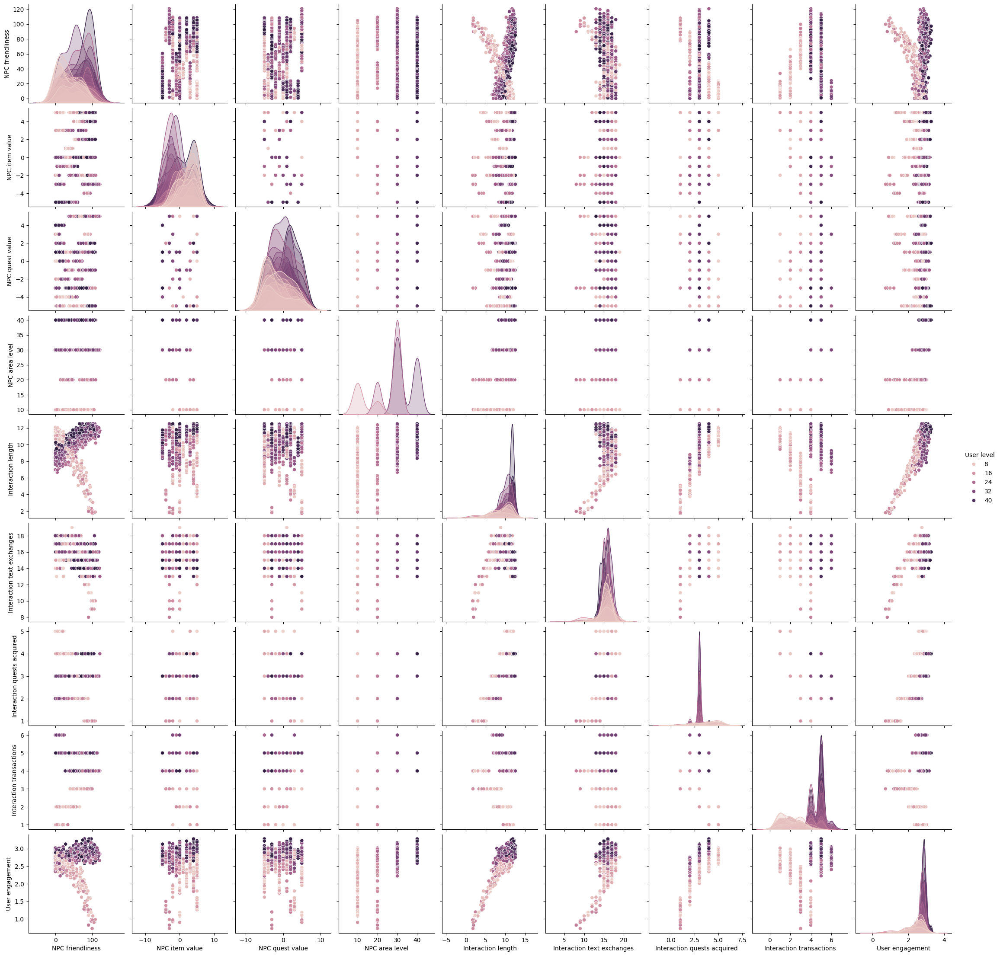

In [34]:
sns.pairplot(df[features + interaction_attributes].sample(1000), hue='User level')

Looks like `User level` may account for the two populations in `NPC friendliness x Interaction length`.
Lower-level users have shorter interactions as the NPC is friendlier, and
higher-level users have longer interactions as the NPC is friendlier. The
distribution for `Interaction transactions` also seems to be different between
lower- and higher-level users, with more experienced users generally performing
more transactions than inexperiened users.

**Hypothesis:** lower-level users run around looking for more lucrative NPCs to
interact with in order to level up quickly. Higher-level users try to have
longer interactions with NPCs to play the long game.

While this is nice and all, I'd like to find features *about the NPCs themselves*
that may drive engagement. I'll use the `NPC area level`, as that strongly
correlates with user level.

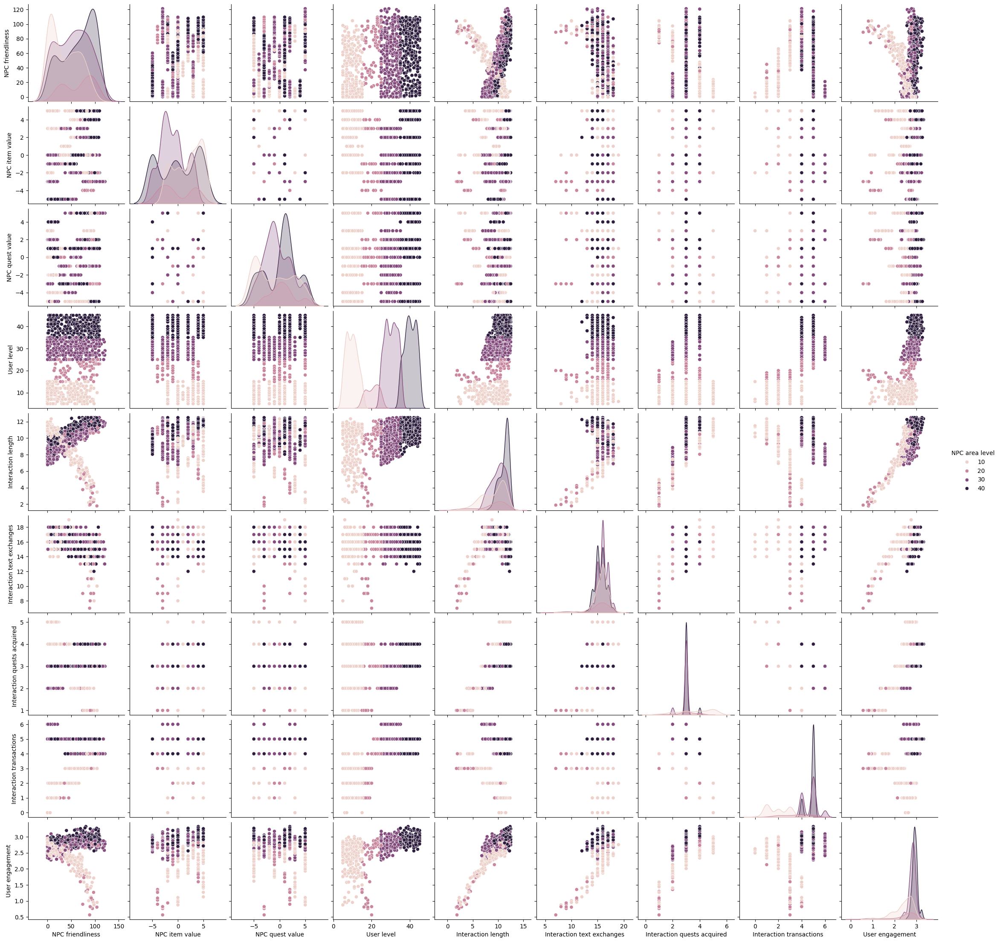

In [36]:
sns.pairplot(df[features + interaction_attributes].sample(1000), hue='NPC area level')

Text(0.5, 1.0, 'NPC friendliness x User Engagement')

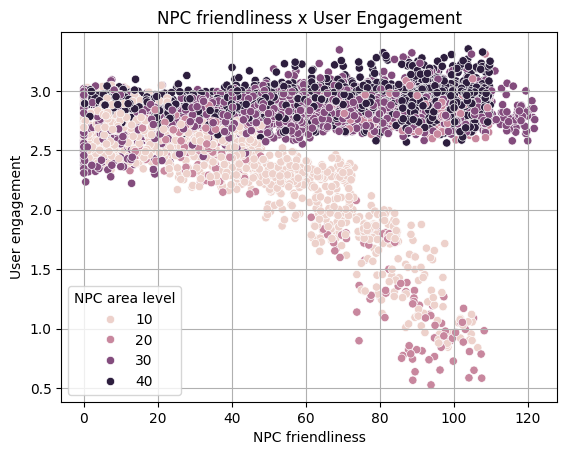

In [ ]:
plt.grid()
sns.scatterplot(df, x='NPC friendliness', y='User engagement', hue='NPC area level',
                )
plt.xlabel('NPC friendliness')
plt.ylabel('User engagement')
plt.title('NPC friendliness x User engagement')

Text(0.5, 1.0, 'User level vs. User engagement')

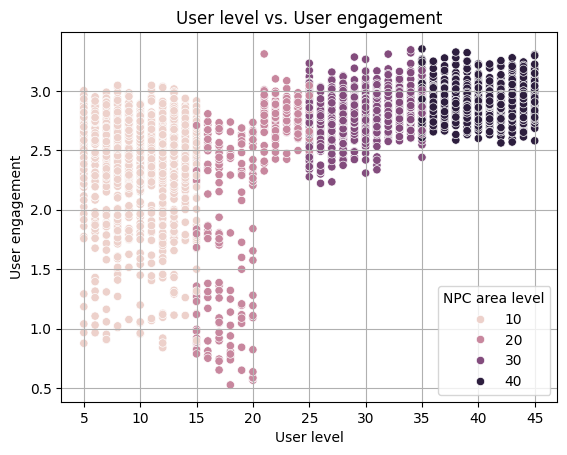

In [150]:
plt.grid()
sns.scatterplot(df, x='User level', y='User engagement', hue='NPC area level')
plt.xlabel('User level')
plt.ylabel('User engagement')
plt.title('User level vs. User engagement')

It seems like lower-level NPCs (those with `NPC area level` = 10 or 20) have
lower user engagement as friendliness increases. On the contrary, those with
higher area level increase user engagement with friendliness. This is consistent
with my observation about user level.

# 🤖 Model Selection, Design, and Training

First, I need to split my dataset into two groups, training a separate model on
each:
- **low-level NPCs**: those with `NPC area level` = 10 or 20
- **high-level NPCs**: those with `NPC area level` = 30 or 40

I'll use **Multiple Linear Regression** on the following features:
- `NPC friendliness`
- `NPC item value`
- `NPC quest value`
- `NPC gender`
- `NPC class`
- `NPC area level`

Since they have different scales, I'll need to scale them prior to training. I
will use the same min-max scaling method since the values have a mostly uniform
distribution and no real outliers.

Since gender and class are categorical variables, I'll need to one-hot encode
them. I'll use the built-in `pd.get_dummies` function to do that.

I'll train my model using **Stochastic Gradient Descent**, saving the cost
at each epoch (because calculating the cost at each iteration is _slow_). I will
**shuffle** the dataset at the beginning of each epoch.



In [46]:
def compute_model_output(x: np.ndarray, w: np.ndarray, b: float) -> np.ndarray:
    """
    Computes the prediction of a linear model
    Args:
      x (ndarray (m,c,))  : Data, m examples with c columns
      w (ndarray (c,))    : Model weights
      b (scalar)          : Model bias
    Returns
      f_wb (ndarray (m,)) : model prediction
    """
    return x @ w + b

def mean_squared_error(y: np.ndarray, y_hat: np.ndarray) -> float:
  assert len(y_hat) == len(y)
  m = len(y)
  return sum((y_hat - y) ** 2) / (2 * m)

def compute_cost(x: np.ndarray, y: np.ndarray, w: np.ndarray, b: float) -> float:
    """
    Computes the cost function for linear regression
    Args:
      x (ndarray (m,c,)): Data, m examples with c columns
      y (ndarray (m,))  : target values
      w (ndarray (c,))  : Model weights
      b (scalar)        : Model bias
    Returns
      total_cost (scalar): the cost
    """
    assert(len(x) == len(y))
    y_hat = compute_model_output(x, w, b)
    return mean_squared_error(y, y_hat)

def compute_gradient(
      x: np.ndarray,
      y: np.ndarray,
      w: np.ndarray,
      b: float
      ) -> tuple[np.ndarray, float]:
    """
    Computes the gradient for linear regression
    Args:
      x (ndarray (m,c,)): Data, m examples with c columns
      y (ndarray (m,))  : target values
      w (ndarray (c,))  : Model weights
      b (scalar)        : Model bias
    Returns
      dj_dw (ndarray (c,)): The gradient of the cost w.r.t. the parameters w
      dj_db (scalar): The gradient of the cost w.r.t. the parameter b
    """
    assert(len(x) == len(y))
    m = len(x)
    residuals = compute_model_output(x, w, b) - y
    dj_dw = x.T @ residuals / m
    dj_db = sum(residuals) / m
    return dj_dw, dj_db

def stochastic_gradient_descent_shuffled(
      x: np.ndarray,
      y: np.ndarray,
      w_in: np.ndarray,
      b_in: float,
      alpha: float,
      num_epochs: int,
      random_seed: int | None = None
      ) -> tuple[np.ndarray, float, list[float]]:
    """SGD: update using one example at a time. Save cost after epochs
    Args:
      x (ndarray (m,c,)): Data, m examples with c columns
      y (ndarray (m,))  : target values
      w_in (ndarray (c)): initial model weights
      b_in (scalar)     : initial model bias
      alpha (float)     : learning rate
      num_epochs (int)  : number of iterations to run gradient descent
    Returns:
      w (ndarray (c)) : updated value of parameter w
      b (scalar)      : updated value of parameter b
      J_history (list): cost values over epochs
    """
    assert len(x) == len(y)
    m = len(x)
    w, b = w_in, b_in
    J_history = []
    for _ in range(num_epochs):
      # shuffle at start of each epoch (includes initial)
      rng = np.random.default_rng(random_seed)
      idx = rng.permutation(m)
      x_shuf=x[idx]
      y_shuf=y[idx]

      # compute cost at each new epoch
      cost = compute_cost(x_shuf, y_shuf, w, b)
      J_history.append(cost)

      # update for each individual point
      for i in range(m):
        x_iter = np.array([x_shuf[i]])
        y_iter = np.array([y_shuf[i]])
        dj_dw, dj_db = compute_gradient(x_iter, y_iter, w, b)
        w = w - (alpha * dj_dw)
        b = b - (alpha * dj_db)
      
    # compute final cost
    cost = compute_cost(x_shuf, y_shuf, w, b)
    J_history.append(cost)

    return w, b, J_history


## ⚖️ Scale Features

In [30]:
for f in npc_attributes:
  if f not in ['NPC gender', 'NPC class']:
    scale_feature_min_max(df, f)

In [31]:
df.columns

Index(['NPC ID', 'NPC friendliness', 'NPC item value', 'NPC quest value',
       'NPC gender', 'NPC class', 'NPC area level', 'User ID', 'User level',
       'User class', 'Interaction length', 'Interaction text exchanges',
       'Interaction quests acquired', 'Interaction transactions',
       'Interaction length (scaled)', 'Interaction text exchanges (scaled)',
       'Interaction quests acquired (scaled)',
       'Interaction transactions (scaled)', 'User engagement',
       'NPC friendliness (scaled)', 'NPC item value (scaled)',
       'NPC quest value (scaled)', 'NPC area level (scaled)'],
      dtype='object')

## 🔥 One-Hot Encode Gender and Class

In [32]:
df = pd.get_dummies(df, columns=['NPC gender', 'NPC class'], drop_first=True)

In [33]:
df.columns

Index(['NPC ID', 'NPC friendliness', 'NPC item value', 'NPC quest value',
       'NPC area level', 'User ID', 'User level', 'User class',
       'Interaction length', 'Interaction text exchanges',
       'Interaction quests acquired', 'Interaction transactions',
       'Interaction length (scaled)', 'Interaction text exchanges (scaled)',
       'Interaction quests acquired (scaled)',
       'Interaction transactions (scaled)', 'User engagement',
       'NPC friendliness (scaled)', 'NPC item value (scaled)',
       'NPC quest value (scaled)', 'NPC area level (scaled)', 'NPC gender_M',
       'NPC class_Mage', 'NPC class_Thief'],
      dtype='object')

## 🏋️ Train Model

In [70]:
features = ['NPC friendliness (scaled)', 'NPC item value (scaled)', 'NPC quest value (scaled)', 'NPC area level (scaled)', 'NPC gender_M', 'NPC class_Mage', 'NPC class_Thief']
x = df[features].to_numpy()
y = df[target].to_numpy()
w_in = np.zeros(len(features))
b_in = 0
alpha = 0.01
epochs = 25

(w, b, J_history) = stochastic_gradient_descent_shuffled(x, y, w_in, b_in, alpha, epochs)


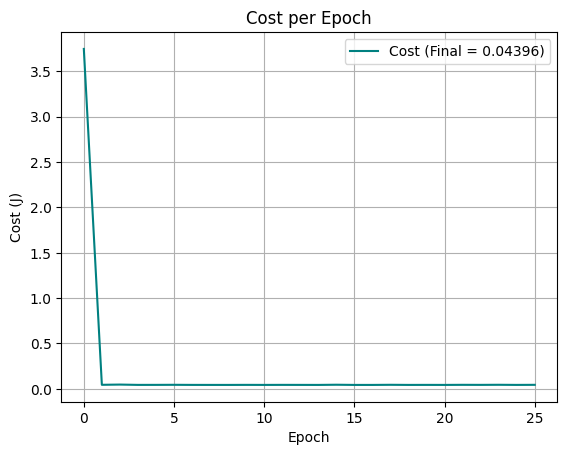

[-0.3303300965155285 0.1815653110673592 -0.06680269142325837
 0.6655451843698725 -0.07582890882062945 -0.04138557129044317
 -0.02309242863797197] 2.416066195665302


In [160]:
plt.title('Cost per Epoch')
plt.plot(J_history, label=f'Cost (Final = {J_history[-1]:0.5f})', color='teal')
plt.xlabel('Epoch')
plt.ylabel('Cost (J)')
plt.legend()
plt.grid()
plt.show()

print(w, b)

In [59]:
df_low = df[df['NPC area level'] < 25]

x_low = df_low[features].to_numpy()
y_low = df_low[target].to_numpy()
w_in = np.zeros(len(features))
b_in = 0
alpha = 0.01
epochs = 25

(w_low, b_low, J_low_history) = stochastic_gradient_descent_shuffled(
  x_low, y_low, w_in, b_in, alpha, epochs)


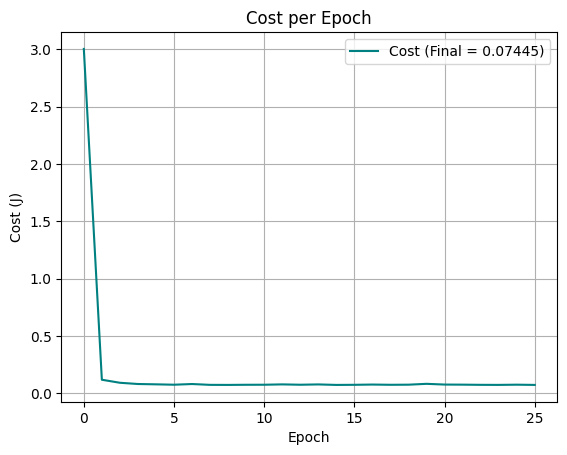

[-1.277490383131094 -0.05179116529091785 -0.10566536198242525
 0.9586380281762827 0.01809685346949294 -0.038236896526396946
 -0.009859979285313951] 2.844004410529577


In [162]:
plt.title('Cost per Epoch')
plt.plot(J_low_history, label=f'Cost (Final = {J_low_history[-1]:0.5f})', c='teal')
plt.grid()
plt.xlabel('Epoch')
plt.ylabel('Cost (J)')
plt.legend()
plt.show()

print(w_low, b_low)

In [61]:
df_high = df[df['NPC area level'] >= 25]

x_high = df_high[features].to_numpy()
y_high = df_high[target].to_numpy()
w_in = np.zeros(len(features))
b_in = 0
alpha = 0.01
epochs = 25

(w_high, b_high, J_high_history) = stochastic_gradient_descent_shuffled(
  x_high, y_high, w_in, b_in, alpha, epochs)


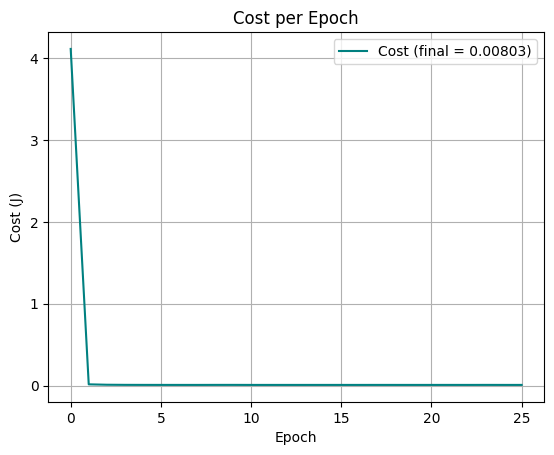

[0.09061056056616063 0.07791343265729074 -0.0077712380695017114
 0.21981766284801557 0.022635749571000712 -0.004979128169340815
 -0.00036721355700382297] 2.6039571089387885


In [164]:
plt.title('Cost per Epoch')
plt.plot(J_high_history, label=f'Cost (final = {J_high_history[-1]:0.5f})', c='teal')
plt.xlabel('Epoch')
plt.ylabel('Cost (J)')
plt.legend()
plt.grid()
plt.show()


print(w_high, b_high)

# 🤔 Interpretation of Results

I expected the cost to be much lower for both halves of the dataset when
splitting it up. For some reason, it's only lower for higher-level NPCs. Maybe
it's because NPCs in level 20 areas could go either way. I'd have to zoom in on
the plot to really see.

In [78]:
print(f'ENTIRE DATASET (J={J_history[-1]:0.5f})')
w_labeled = zip(features, w)
for label, weight in sorted(w_labeled, key=lambda p: abs(p[1]), reverse=True):
  print('\t', f'{weight:0.4f}:', label)

print()
print(f'LOW-LEVEL NPCS (J={J_low_history[-1]:0.5f})')
w_low_labeled = zip(features, w_low)
for label, weight in sorted(w_low_labeled, key=lambda p: abs(p[1]), reverse=True):
  print('\t', f'{weight:0.4f}:', label)

print()
print(f'HIGH-LEVEL NPCS (J={J_high_history[-1]:0.5f})')
w_high_labeled = zip(features, w_high)
for label, weight in sorted(w_high_labeled, key=lambda p: abs(p[1]), reverse=True):
  print('\t', f'{weight:0.4f}:', label)


ENTIRE DATASET (J=0.04396)
	 0.6655: NPC area level (scaled)
	 -0.3303: NPC friendliness (scaled)
	 0.1816: NPC item value (scaled)
	 -0.0758: NPC gender_M
	 -0.0668: NPC quest value (scaled)
	 -0.0414: NPC class_Mage
	 -0.0231: NPC class_Thief

LOW-LEVEL NPCS (J=0.07445)
	 -1.2775: NPC friendliness (scaled)
	 0.9586: NPC area level (scaled)
	 -0.1057: NPC quest value (scaled)
	 -0.0518: NPC item value (scaled)
	 -0.0382: NPC class_Mage
	 0.0181: NPC gender_M
	 -0.0099: NPC class_Thief

HIGH-LEVEL NPCS (J=0.00803)
	 0.2198: NPC area level (scaled)
	 0.0906: NPC friendliness (scaled)
	 0.0779: NPC item value (scaled)
	 0.0226: NPC gender_M
	 -0.0078: NPC quest value (scaled)
	 -0.0050: NPC class_Mage
	 -0.0004: NPC class_Thief


Above are lists of the various features used for training the models paired with
the resultant model weights and sorted by magnitude, with the most important
features at the top.

# 🎭 Compare Old and New NPCs

In [86]:
olds = pd.read_csv('Updated_Old_NPCs.csv')
display(olds.describe().T)

seasonals = pd.read_csv('Updated_Seasonal_NPCs.csv')
display(seasonals.describe().T)

all_npcs = pd.concat([olds, seasonals], ignore_index=True)
all_npcs['Version'] = np.where(all_npcs['NPC ID'] <= 300, 'Old', 'Seasonal')
all_npcs.describe().T

,count,mean,std,min,25%,50%,75%,max
NPC ID,300.0,150.500000,86.746758,1.000000,75.75000,150.500000,225.250000,300.000000
NPC friendliness,300.0,48.046847,28.836704,0.149354,23.09193,46.282477,71.358085,99.654065
NPC item value,300.0,0.013333,2.112193,-3.000000,-2.00000,0.000000,2.000000,3.000000
NPC quest value,300.0,0.133333,2.067964,-3.000000,-2.00000,0.000000,2.000000,3.000000
NPC area level,300.0,25.633333,11.359093,10.000000,20.00000,30.000000,40.000000,40.000000


,count,mean,std,min,25%,50%,75%,max
NPC ID,50.0,325.500000,14.577380,301.000,313.25000,325.500000,337.750000,350.000000
NPC friendliness,50.0,41.411874,27.038739,0.961,15.75742,41.087209,62.870451,96.916659
NPC item value,50.0,0.140000,3.270212,-5.000,-2.00000,0.000000,3.000000,5.000000
NPC quest value,50.0,-0.160000,3.284845,-5.000,-3.00000,0.000000,2.000000,5.000000
NPC area level,50.0,26.000000,11.780302,10.000,10.00000,30.000000,40.000000,40.000000


,count,mean,std,min,25%,50%,75%,max
NPC ID,350.0,175.500000,101.180532,1.000000,88.250000,175.500000,262.750000,350.000000
NPC friendliness,350.0,47.098994,28.643915,0.149354,22.170875,45.541134,68.695041,99.654065
NPC item value,350.0,0.031429,2.307738,-5.000000,-2.000000,0.000000,2.000000,5.000000
NPC quest value,350.0,0.091429,2.278009,-5.000000,-2.000000,0.000000,2.000000,5.000000
NPC area level,350.0,25.685714,11.403693,10.000000,20.000000,30.000000,40.000000,40.000000


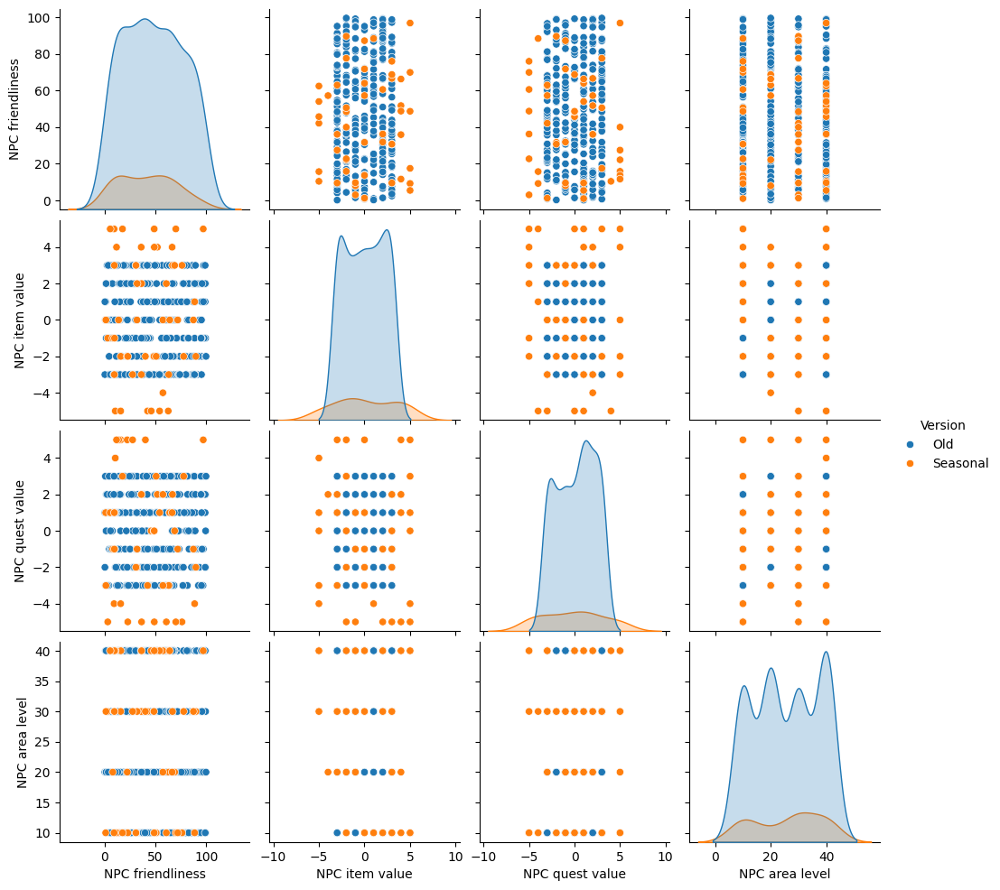

In [85]:
sns.pairplot(all_npcs[[col for col in all_npcs.columns if col != 'NPC ID']], hue='Version')

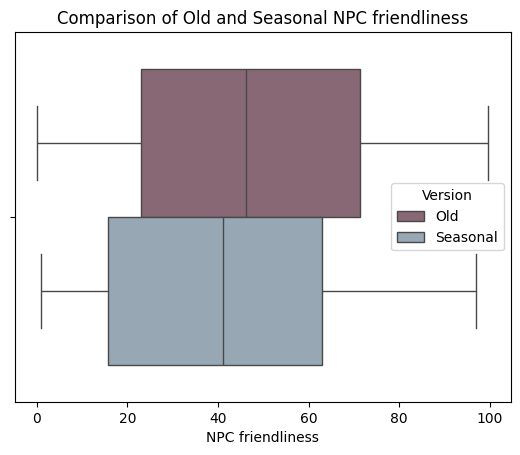

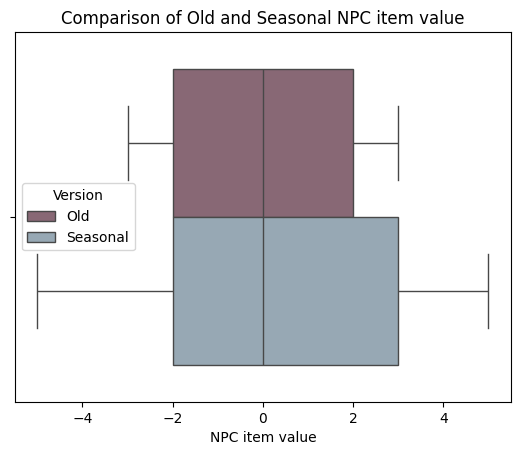

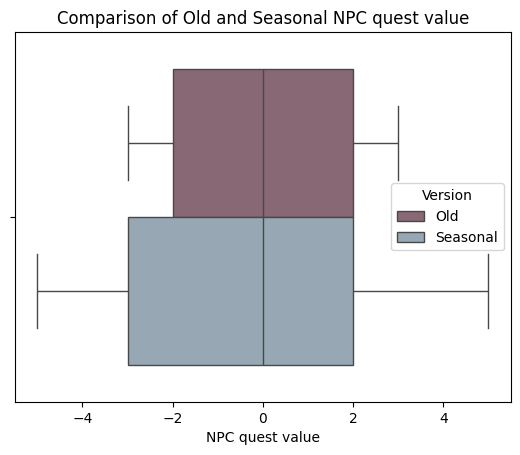

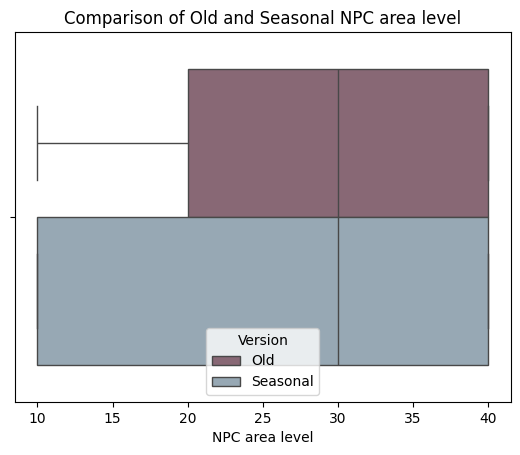

In [167]:
for c in ['NPC friendliness', 'NPC item value', 'NPC quest value', 'NPC area level']:
  plt.title(f'Comparison of Old and Seasonal {c}')
  sns.boxplot(all_npcs, x=c, hue='Version', palette=['#8d6374', '#92a9b9'])
  plt.show()

Text(0.5, 1.0, 'NPC Gender Proportions')

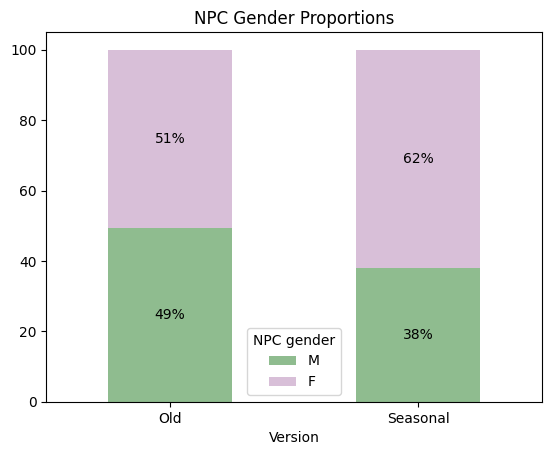

In [121]:
ax = ((all_npcs.groupby('Version')['NPC gender']
  .value_counts(normalize=True)
  .unstack() * 100)
  .reindex(columns=['M', 'F'])
  .plot(
    kind='bar',
    stacked=True,
    color=['darkseagreen', 'thistle']
    )
)
for container in ax.containers:
  ax.bar_label(container, fmt="%0.0f%%", label_type='center') # type: ignore

ax.tick_params(axis='x', labelrotation=0)

plt.title('NPC Gender Proportions')


Text(0.5, 1.0, 'NPC Class Proportions')

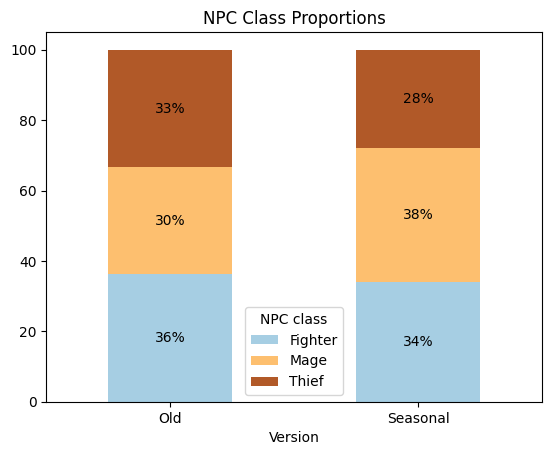

In [131]:
ax = ((all_npcs.groupby('Version')['NPC class']
  .value_counts(normalize=True)
  .unstack() * 100)
  .plot(
    kind='bar',
    stacked=True,
    colormap='Paired'
    )
)
for container in ax.containers:
  ax.bar_label(container, fmt="%0.0f%%", label_type='center') # type: ignore

ax.tick_params(axis='x', labelrotation=0)

plt.title('NPC Class Proportions')